# Astrocytes

The astrocyte clustering with multiome reveals more clusters than either RNA or ATAC on their own. Several clusters (especially smaller ones) 
were expressing genes associated with haltin proliferation. 
 - **Clusters 0, 1, 3** - With a large gradient spread for protoplasmic astrocytes (inactive, low GFAP), the gene expression variation for this series of clusters (**0, 1, 3**) is clearly a gradient, making subclustering challenging. This population shifts in two directions: towards cluster 4 and 5, which have a lot of mitochondrial markers, and cluster 2, which has activation markers consistent with fibrous astrocytes. 
 - **Clusters 4 and 5** are not evident in RNA only data, and have differential genes that would be expected to be captured in the cytoplasm rather than nucleus. I suspect this is an indication of astrocytes undergoing cellular stress, potentially cell death. 
 - **Cluster 2** Activated astrocytes are a relatively small population. 
 - **Cluster 6** - This cluster has several HVGs associated with synaptic function, maintenance as well as cytokine response (interleukin receptors, cytokine pathway mediation). 
 - **Cluster 7** - This cluster has several genes associated with immune response (cytokine receptors), mobility and synapse maintenance. 
 - **Cluster 8** - Cluster associated with new synapse formation and immune response (complement protein, T-cell signalling)
 - **Cluster 9** - EXCLUDE (Only one sample)
 - **Cluster 10** - non-coding markers
 - **Cluster 11** - inflammation, neutrophil recruitment
 - **Cluster 12** - HBA1, HBA2 - iron stress?
 - **Cluster 13** - non-coding markers

# 1.0 First checks

In [1]:
import muon as mu
import numpy as np
import scanpy as sc


In [2]:
mudata = mu.read('Astrocytes_clustered.h5mu')


In [3]:
mudata['rna'].obsm['X_umap'] = mudata.obsm['X_umap']
mudata['rna'].obs['mm_leiden_res0.7'] = mudata.obs['leiden_res0.7']
mudata['rna'].obs['mm_leiden_res0.7']

index
AAACAGCCAAACAACA-55    3
AAACAGCCAAACCTTG-34    0
AAACAGCCAACAGCCT-47    1
AAACAGCCAACTAGAA-12    4
AAACAGCCAACTAGAA-25    2
                      ..
TTTGTTGGTTGGCGTG-37    5
TTTGTTGGTTGGTTAG-13    1
TTTGTTGGTTTACTTG-39    4
TTTGTTGGTTTAGTCC-51    0
TTTGTTGGTTTCAGGA-12    9
Name: mm_leiden_res0.7, Length: 49403, dtype: category
Categories (14, object): ['0', '1', '10', '11', ..., '6', '7', '8', '9']

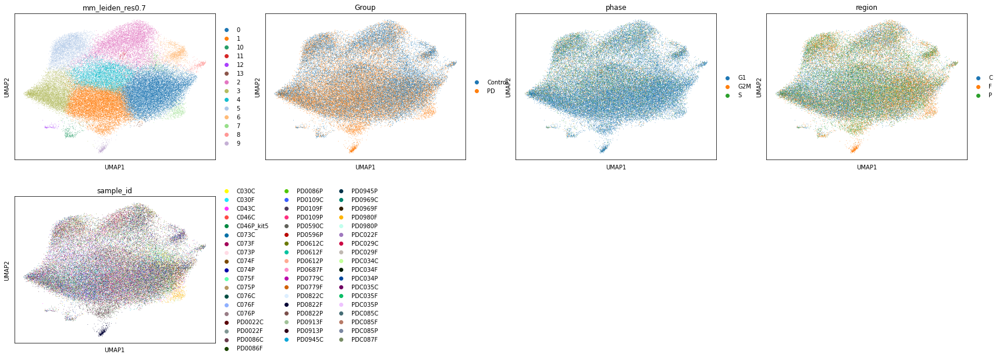

In [4]:
genes = [ 'mm_leiden_res0.7','Group', 'phase', 'region','sample_id']

sc.pl.umap(mudata['rna'], color = genes)

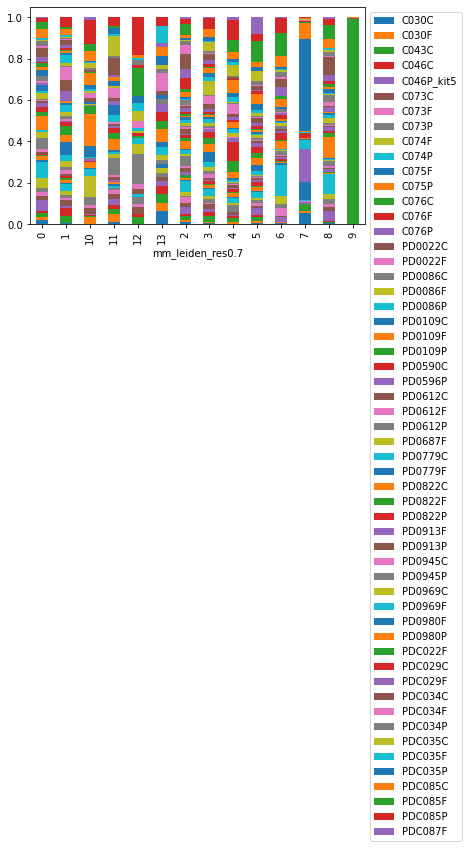

In [5]:
import pandas as pd
tmp = pd.crosstab(mudata['rna'].obs['mm_leiden_res0.7'],mudata['rna'].obs['sample_id'],normalize='index')
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.0, 1.0))

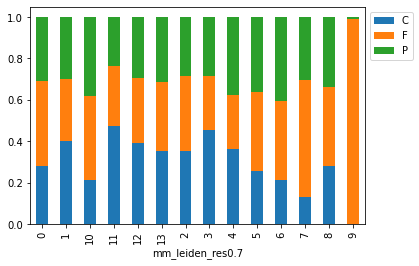

In [6]:
import pandas as pd
tmp = pd.crosstab(mudata['rna'].obs['mm_leiden_res0.7'],mudata['rna'].obs['region'],normalize='index')
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.0, 1.0))

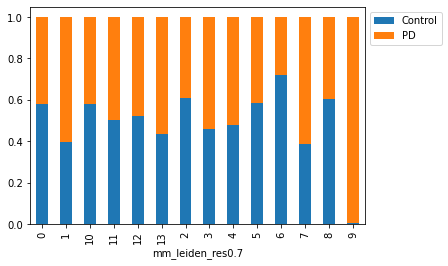

In [7]:
import pandas as pd
tmp = pd.crosstab(mudata['rna'].obs['mm_leiden_res0.7'],mudata['rna'].obs['Group'],normalize='index')
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.0, 1.0))

# 2.0 Checking known markers

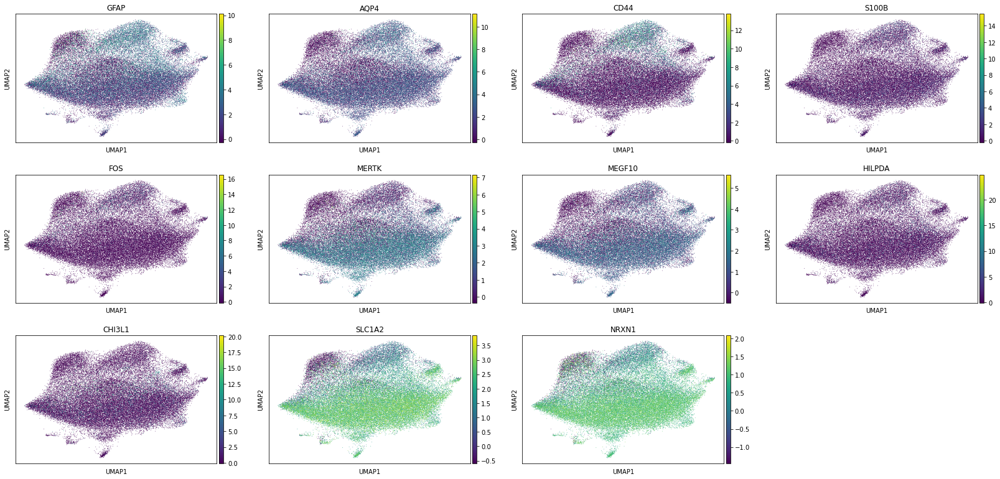

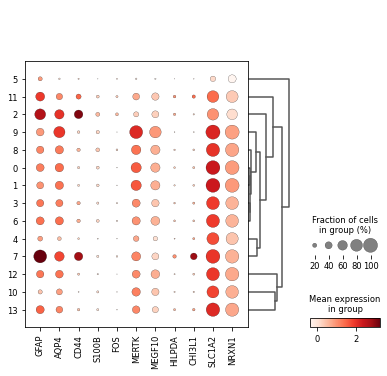

In [8]:
genes = ['GFAP', 'AQP4','CD44', 'S100B', 'FOS', 'MERTK', 'MEGF10', 'HILPDA', 'CHI3L1', 'SLC1A2', 'NRXN1']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

# 3.0 Cluster characterisation (HVGs)

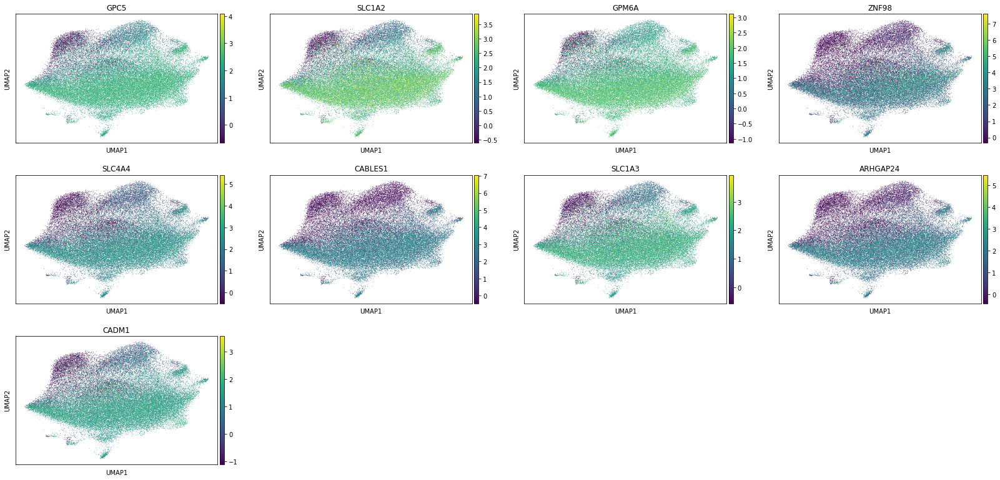

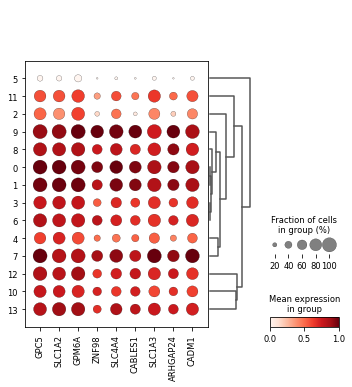

In [9]:
# Cluster 0 - Protoplasmic - GPC5hi_ZNF98hi

genes = ['GPC5', 'SLC1A2', 'GPM6A', 'ZNF98', 'SLC4A4', 'CABLES1', 'SLC1A3', 'ARHGAP24', 'CADM1']
sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True, standard_scale = 'var')

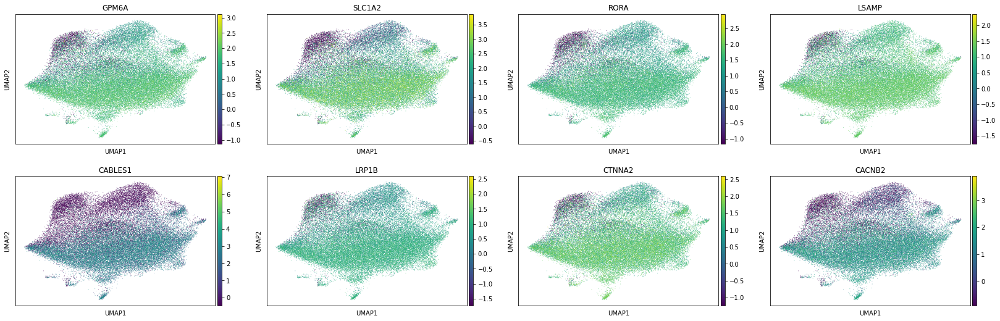

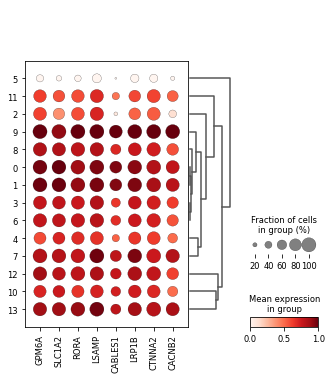

In [10]:
# Cluster 1 - Protoplasmic - GPC5hi_ZNF98med

genes = ['GPM6A', 'SLC1A2', 'RORA', 'LSAMP', 'CABLES1','LRP1B', 'CTNNA2', 'CACNB2']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True, standard_scale = 'var')

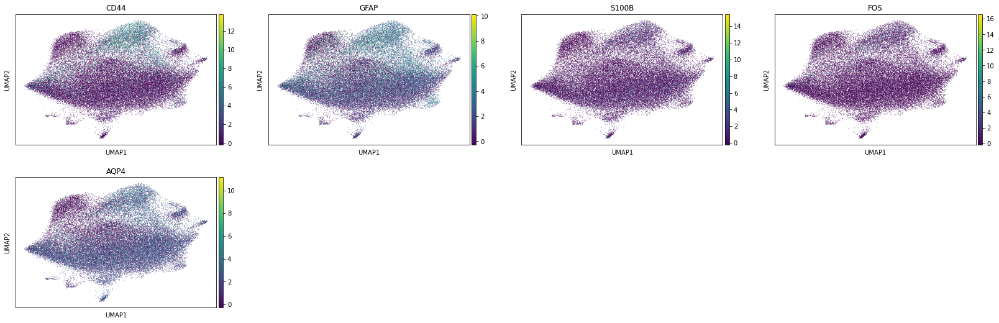

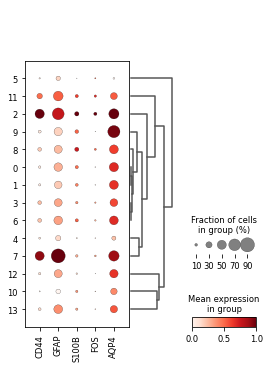

In [11]:
# Cluster 2 - Fibrous - GFAPhi_CD44hi_S100Bhi_FOSpos

genes = ['CD44', 'GFAP', 'S100B', 'FOS', 'AQP4']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True, standard_scale = 'var')

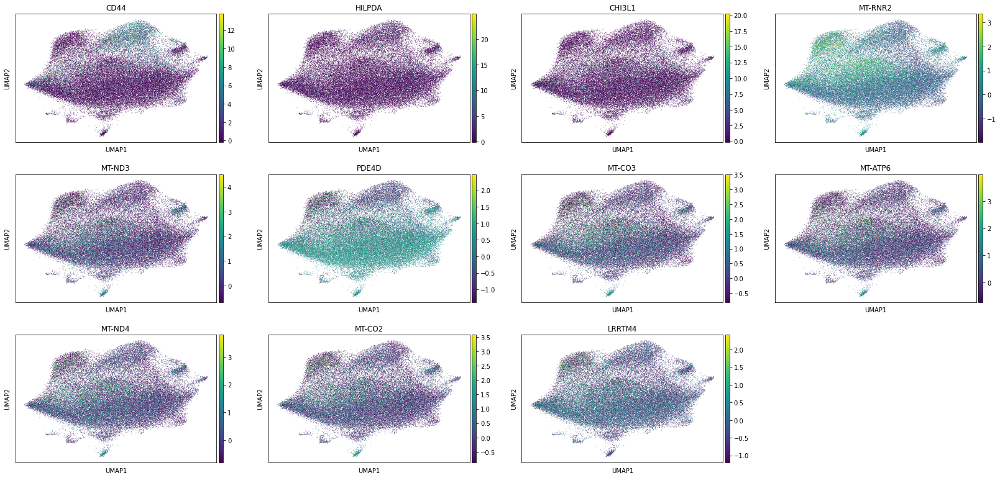

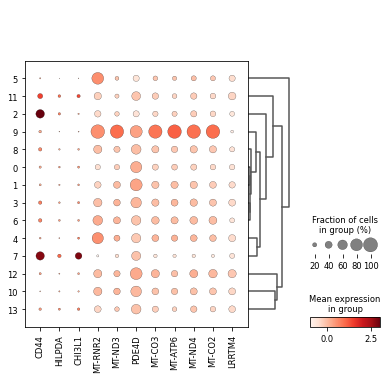

In [12]:
# Cluster 3 - GPC5hi_ZNF98lo

genes = ['CD44', 'HILPDA', 'CHI3L1', 'MT-RNR2', 'MT-ND3', 'PDE4D', 'MT-CO3', 'MT-ATP6', 'MT-ND4', 'MT-CO2', 'LRRTM4']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

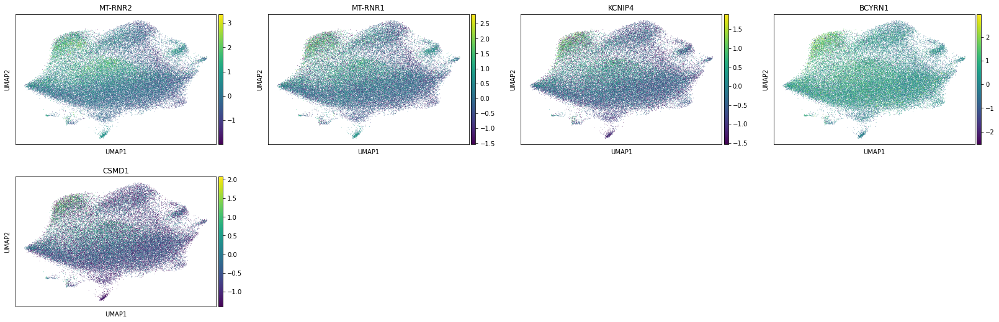

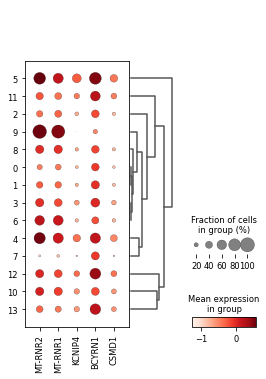

In [13]:
# Cluster 4 - MT-RNR2hi_AQP4lo

genes = ['MT-RNR2', 'MT-RNR1', 'KCNIP4', 'BCYRN1', 'CSMD1']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

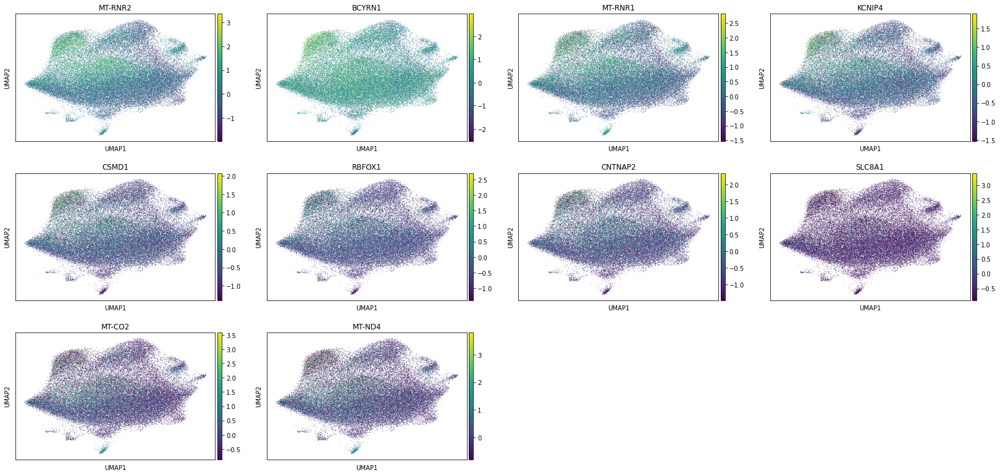

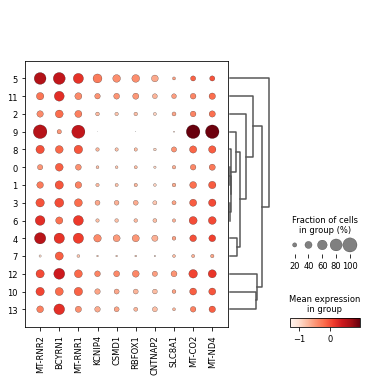

In [14]:
# Cluster 5 - BCYRN1hi_KCNIP4hi

genes = ['MT-RNR2', 'BCYRN1', 'MT-RNR1', 'KCNIP4', 'CSMD1', 'RBFOX1', 'CNTNAP2', 'SLC8A1', 'MT-CO2', 'MT-ND4']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

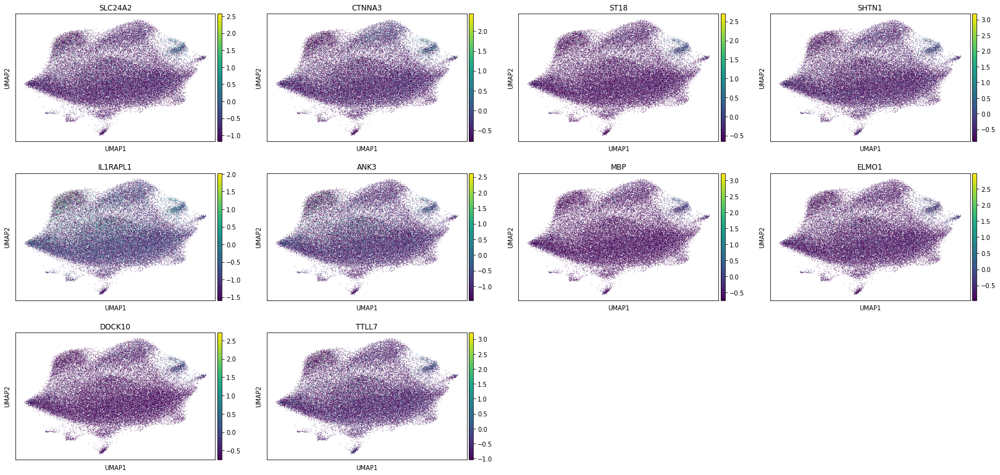

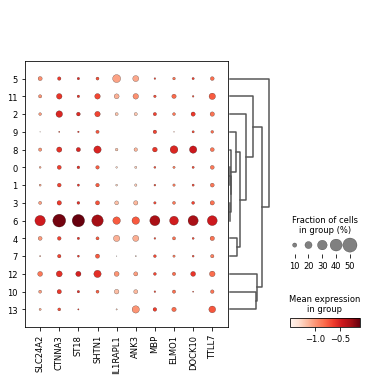

In [15]:
# Cluster 6 - SLC24A2pos_CTNNA3hi

genes = ['SLC24A2', 'CTNNA3', 'ST18', 'SHTN1', 'IL1RAPL1', 'ANK3', 'MBP', 'ELMO1', 'DOCK10', 'TTLL7']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

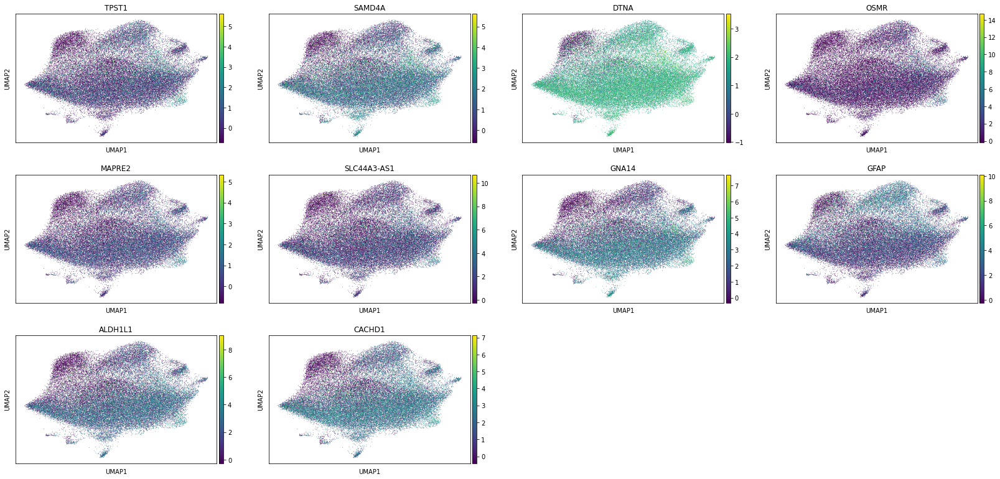

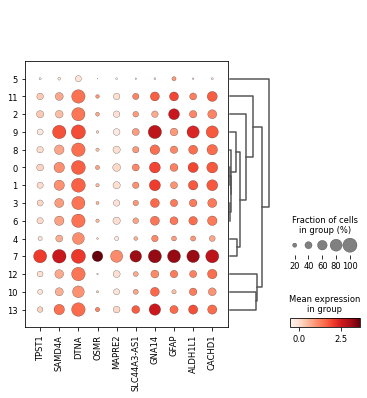

In [16]:
# Cluster 7 OSMRpos_MAPRE2hi

genes = ['TPST1', 'SAMD4A', 'DTNA', 'OSMR', 'MAPRE2', 'SLC44A3-AS1', 'GNA14', 'GFAP', 'ALDH1L1', 'CACHD1']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

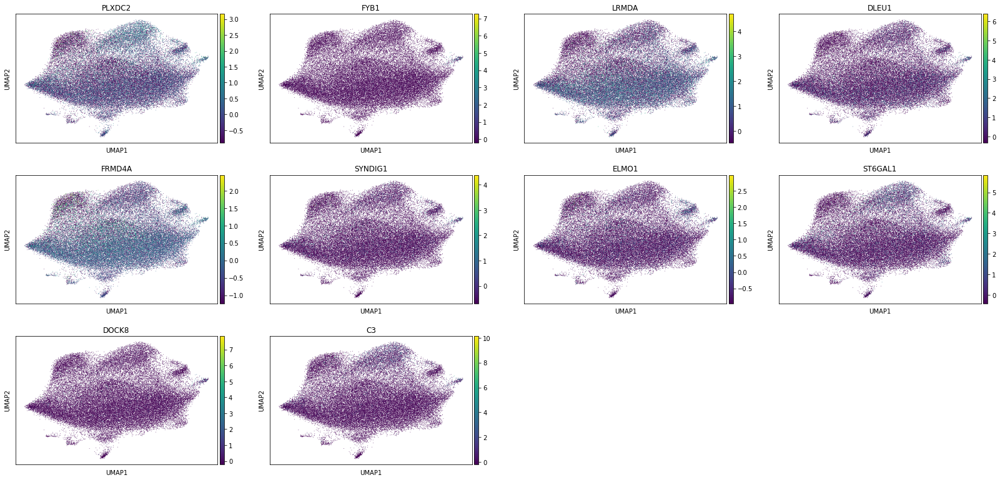

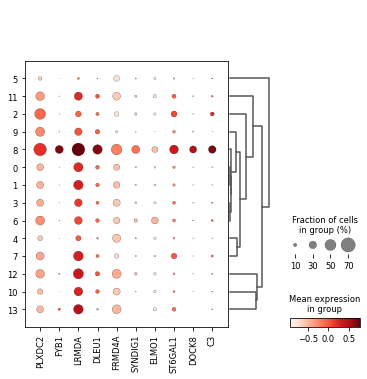

In [17]:
# Cluster 8 - PLXDC2hi_FYB1pos_DLEU1pos

genes = ['PLXDC2', 'FYB1', 'LRMDA', 'DLEU1', 'FRMD4A', 'SYNDIG1', 'ELMO1', 'ST6GAL1', 'DOCK8', 'C3']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

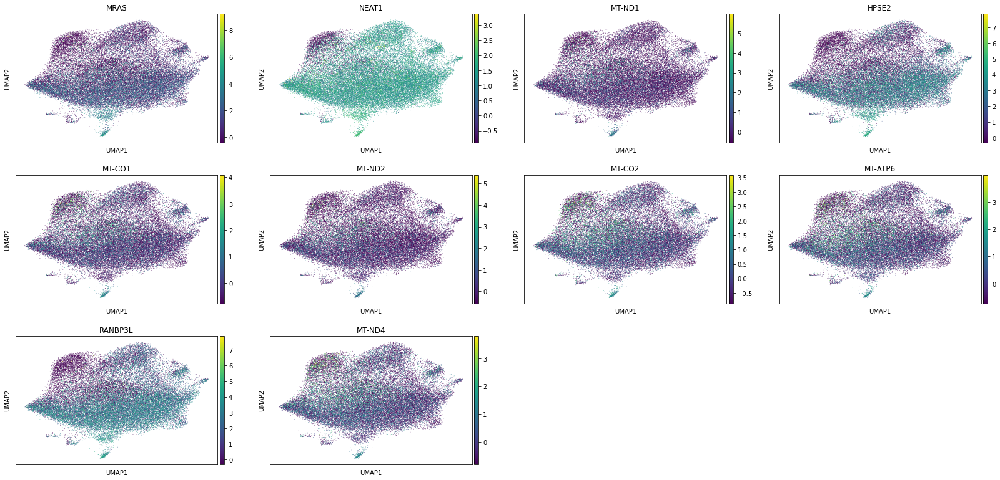

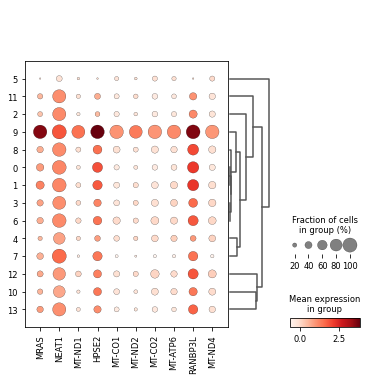

In [18]:
# Cluster 9 - EXCLUDE

genes = ['MRAS', 'NEAT1', 'MT-ND1', 'HPSE2', 'MT-CO1', 'MT-ND2', 'MT-CO2', 'MT-ATP6', 'RANBP3L', 'MT-ND4']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

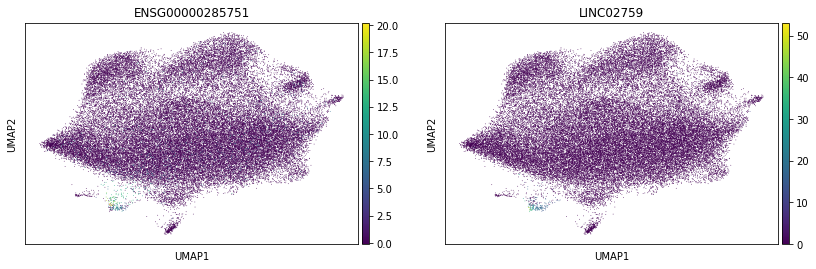

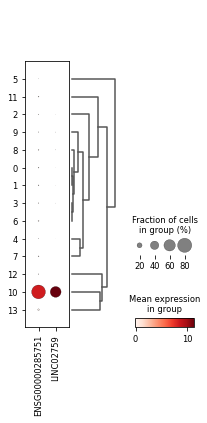

In [19]:
# Cluster 10 - RPL18P8_LINC02759

genes = ['ENSG00000285751', 'LINC02759']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

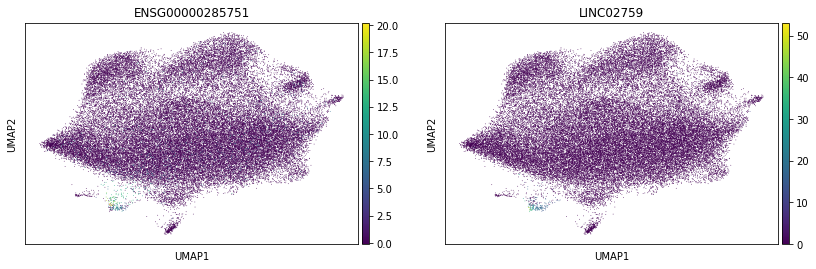

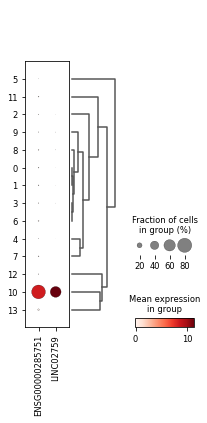

In [20]:
# Cluster 10 - RPL18P8_LINC02759

genes = ['ENSG00000285751', 'LINC02759']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

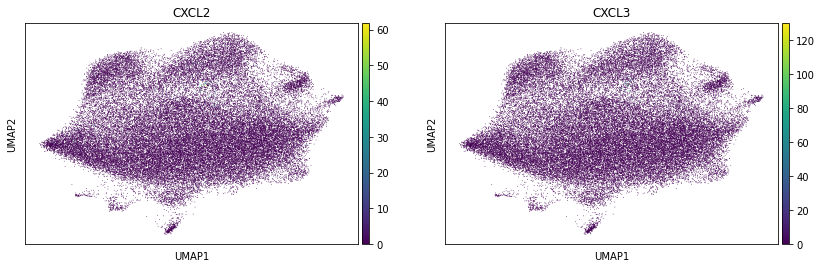

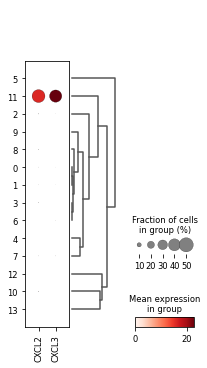

In [21]:
# Cluster 11  - inflammation, neutrophil recruitment - CXCL2_CXCL3

genes = ['CXCL2', 'CXCL3']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

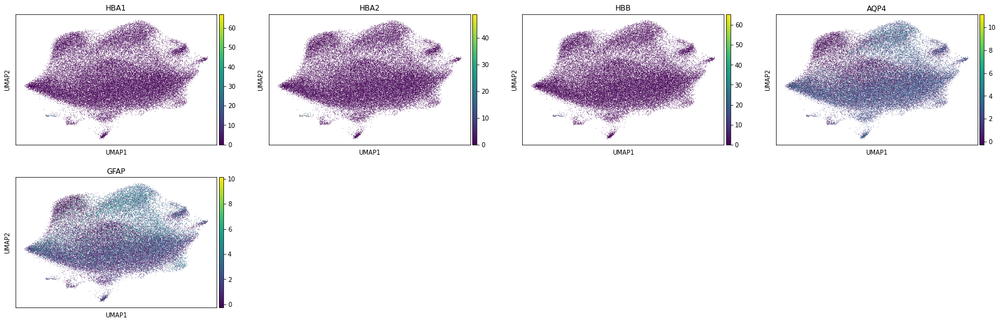

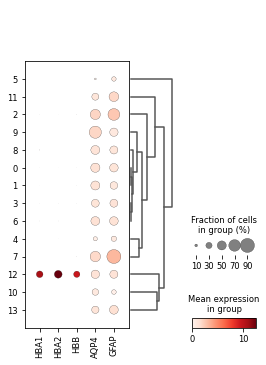

In [22]:
# Cluster 12 - HBA1_HBA2
# https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2887669/

genes = ['HBA1', 'HBA2', 'HBB', 'AQP4', 'GFAP']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

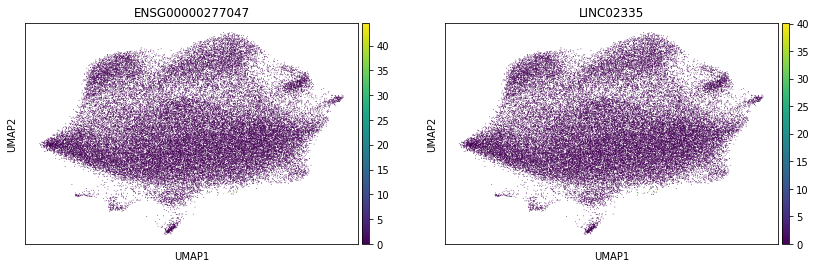

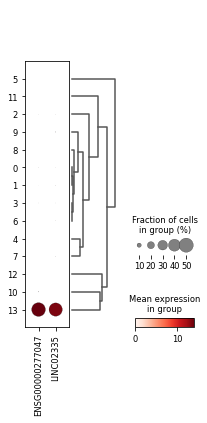

In [23]:
# Cluster 13 - LOC124903233_LINC02335

genes = ['ENSG00000277047', 'LINC02335']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.7', dendrogram = True)

# 4.0 Rename clusters and final checks

In [4]:
mudata['rna'].obs['annotation_level_0'] = mudata['rna'].obs['mm_leiden_res0.7'].replace({'0' : 'Astrocytes',
 '1' : 'Astrocytes',
 '2' : 'Astrocytes',
 '3' : 'Astrocytes',
 '4' : 'Astrocytes',
 '5' : 'Astrocytes',
 '6' : 'Astrocytes',
 '7' : 'Astrocytes',
 '8' : 'Astrocytes',
 '9' : 'drop',
 '10' : 'Astrocytes',
 '11' : 'Astrocytes',
 '12' : 'Astrocytes',
 '13' : 'Astrocytes'
})

mudata['rna'].obs['annotation_level_1'] = mudata['rna'].obs['mm_leiden_res0.7'].replace({'0' : 'Protoplasmic astrocytes',
 '1' : 'Protoplasmic astrocytes',
 '2' : 'Fibrous astrocytes',
 '3' : 'Protoplasmic astrocytes',
 '4' : 'Protoplasmic astrocytes',
 '5' : 'Protoplasmic astrocytes',
 '6' : 'Protoplasmic astrocytes',
 '7' : 'Fibrous astrocytes',
 '8' : 'Protoplasmic astrocytes',
 '9' : 'drop',
 '10' : 'Protoplasmic astrocytes',
 '11' : 'Fibrous astrocytes',
 '12' : 'Protoplasmic astrocytes',
 '13' : 'Protoplasmic astrocytes'
})

mudata['rna'].obs['annotation_level_2'] = mudata['rna'].obs['mm_leiden_res0.7'].replace({'0' : 'ProtoAstro_GPC5hi_ZNF98hi',
 '1' : 'ProtoAstro_GPC5hi_ZNF98med',
 '2' : 'FibrousAstro_GFAPhi_CD44hi_S100Bhi_FOSpos',
 '3' : 'ProtoAstro_GPC5hi_ZNF98lo',
 '4' : 'ProtoAstro_MT-RNR2hi_AQP4lo',
 '5' : 'ProtoAstro_BCYRN1hi_KCNIP4hi',
 '6' : 'ProtoAstro_SLC24A2pos_CTNNA3hi',
 '7' : 'FibrousAstro_OSMRpos_MAPRE2hi',
 '8' : 'ProtoAstro_PLXDC2hi_FYB1pos_DLEU1pos',
 '9' : 'drop',
 '10' : 'ProtoAstro_RPL18P8_LINC02759',
 '11' : 'FibrousAstro_CXCL2pos_CXCL3pos',
 '12' : 'ProtoAstro_HBA1_HBA2',
 '13' : 'ProtoAstro_LOC124903233_LINC02335'
})

In [25]:
#mudata['rna'].obs[['annotation_level_0','annotation_level_1','annotation_level_2']].to_csv('../../all_subclustered_annotations/astrocyte_annotations.csv')

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(rc={'figure.figsize':(11,11)}, font_scale=1.8)
sns.set_style('white')

sc.pl.umap(mudata[mudata['rna'].obs['annotation_level_0']!='drop']['rna'], color = 'annotation_level_2', s = 20, palette=sns.color_palette("husl", len(mudata[mudata['rna'].obs['annotation_level_0']!='drop']['rna'].obs['annotation_level_2'].unique())))
plt.savefig('astros_annotation_level_2_UMAP.png', dpi = 300)
plt.show()

/camp/lab/gandhis/home/users/grantpm/.conda/envs/panpipes/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
